# first attempt at cls

In [1]:
from dnn_evals.evals.cognitive.geometric_scramble_index import (
    GeometricScrambleIndex_Blocks,
    GeometricScrambleIndex_BlockShuffle,
    GeometricScrambleIndex_BlockRotate,
    GeometricScrambleIndex_BlockShuffleRotate,
)

In [2]:
gsi = GeometricScrambleIndex_Blocks('imagenette2')
gsi.config

{'analysis': 'GeometricScrambleIndex_Blocks',
 'dataset_name': 'imagenette2',
 'img_size': 256,
 'crop_size': 224,
 'mean': [0.485, 0.456, 0.406],
 'std': [0.229, 0.224, 0.225],
 'grayscale': True,
 'block_shuffle': True,
 'block_rotate': False,
 'shuffle_seed': 12345,
 'rotation_seed': 123456}

In [5]:
# gsi.show_images(1)

In [6]:
gsi = GeometricScrambleIndex_BlockShuffle('imagenette2')
gsi.config

{'analysis': 'GeometricScrambleIndex_BlockShuffle',
 'dataset_name': 'imagenette2',
 'img_size': 256,
 'crop_size': 224,
 'mean': [0.485, 0.456, 0.406],
 'std': [0.229, 0.224, 0.225],
 'grayscale': True,
 'block_shuffle': True,
 'block_rotate': False,
 'shuffle_seed': 12345,
 'rotation_seed': 123456}

In [8]:
# gsi.show_images(1)

In [9]:
gsi = GeometricScrambleIndex_BlockRotate('imagenette2')
gsi.config

{'analysis': 'GeometricScrambleIndex_BlockRotate',
 'dataset_name': 'imagenette2',
 'img_size': 256,
 'crop_size': 224,
 'mean': [0.485, 0.456, 0.406],
 'std': [0.229, 0.224, 0.225],
 'grayscale': True,
 'block_shuffle': False,
 'block_rotate': True,
 'shuffle_seed': 12345,
 'rotation_seed': 123456}

In [11]:
# gsi.show_images(1)

In [12]:
gsi = GeometricScrambleIndex_BlockShuffleRotate('imagenette2')
gsi.config

{'analysis': 'GeometricScrambleIndex_BlockShuffleRotate',
 'dataset_name': 'imagenette2',
 'img_size': 256,
 'crop_size': 224,
 'mean': [0.485, 0.456, 0.406],
 'std': [0.229, 0.224, 0.225],
 'grayscale': True,
 'block_shuffle': True,
 'block_rotate': True,
 'shuffle_seed': 12345,
 'rotation_seed': 123456}

In [14]:
# gsi.show_images(1)

In [15]:
gsi = GeometricScrambleIndex_BlockShuffle('imagenette2', entity='alvarezlab', project='geometric-scramble-eval-dev')
gsi

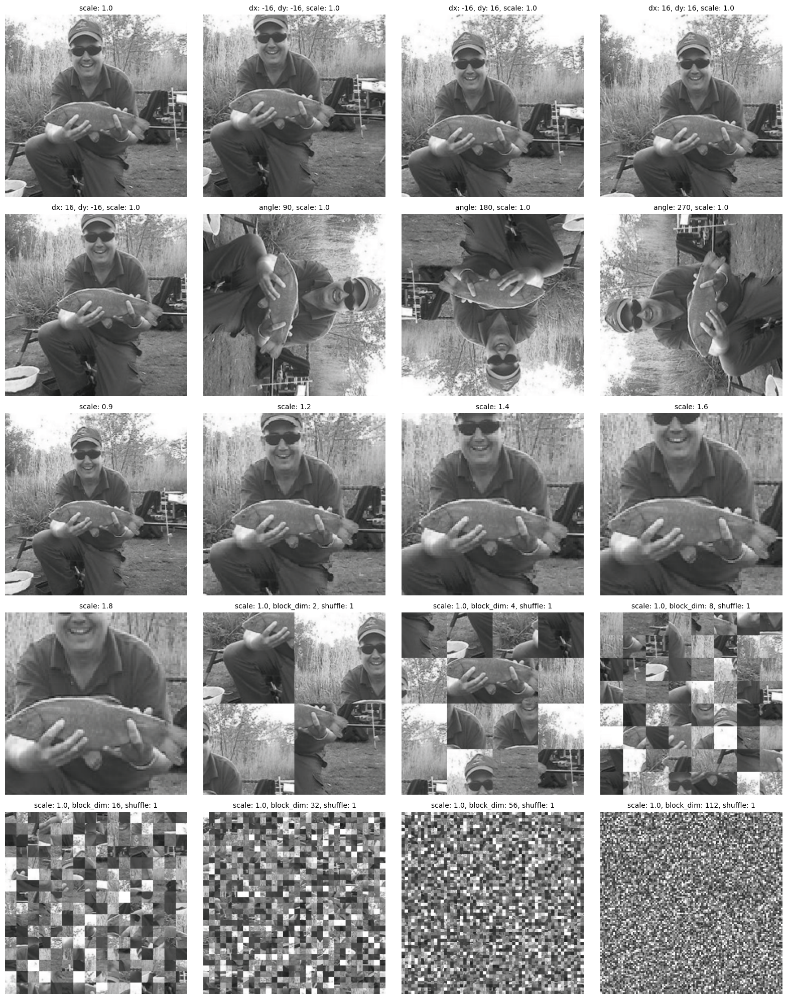

In [16]:
gsi.show_images(index=1)

# run analysis

In [71]:
%config InlineBackend.figure_format='retina'

In [72]:
from dnn_evals.evals.cognitive.geometric_scramble_index import (
    GeometricScrambleIndex_Blocks,
    GeometricScrambleIndex_BlockShuffle,
    GeometricScrambleIndex_BlockRotate,
    GeometricScrambleIndex_BlockShuffleRotate,
)

In [73]:
gsi = GeometricScrambleIndex_BlockShuffle('imagenette2', entity='alvarezlab', project='geometric-scramble-eval-dev')
gsi

In [74]:
import torch
from torchvision import models, transforms
from torchvision.models import get_weight
from pathlib import Path
from types import SimpleNamespace

# arch = 'vit_l_16'
# weights_name = 'ViT_L_16_Weights.IMAGENET1K_V1'

device = 'cuda' if torch.cuda.is_available() else 'cpu'
device

'cuda'

In [75]:
arch = 'alexnet'
weights_name = 'AlexNet_Weights.IMAGENET1K_V1'

# arch = 'vgg16'
# weights_name = 'VGG16_Weights.IMAGENET1K_V1'

arch = 'resnet50'
weights_name = 'ResNet50_Weights.IMAGENET1K_V1'

# arch = 'vit_l_16'
# weights_name = 'ViT_L_16_Weights.IMAGENET1K_V1'

# arch = 'convnext_tiny'
# weights_name = 'ConvNeXt_Tiny_Weights.IMAGENET1K_V1'

# arch = 'convnext_small'
# weights_name = 'ConvNeXt_Small_Weights.IMAGENET1K_V1'

# arch = 'resnext50_32x4d'
# weights_name = 'ResNeXt50_32X4D_Weights.IMAGENET1K_V1'

# arch = 'vit_b_32'
# weights_name = 'ViT_B_32_Weights.IMAGENET1K_V1'

weights = get_weight(weights_name)
hash_id = Path(weights.url).stem.split("-")[-1] # "my-special-alexnet"

meta = dict(
    arch=arch, 
    weights_name=weights_name, 
    weights_url=weights.url, 
    hash_id=hash_id,
    task='category_supervision',
    train_dataset='in1k'
)
print(meta)
model = models.__dict__[arch](weights=weights)
model.to(device)

{'arch': 'resnet50', 'weights_name': 'ResNet50_Weights.IMAGENET1K_V1', 'weights_url': 'https://download.pytorch.org/models/resnet50-0676ba61.pth', 'hash_id': '0676ba61', 'task': 'category_supervision', 'train_dataset': 'in1k'}


ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

In [76]:
import math

In [77]:
if arch == 'inception_v3':
    transform = transforms.Compose([
        transforms.Resize(math.ceil(256/224*299)),
        transforms.CenterCrop(299),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ])    
else:
    transform = transforms.Compose([
        transforms.Resize(256),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ])
transform    

Compose(
    Resize(size=256, interpolation=bilinear, max_size=None, antialias=warn)
    CenterCrop(size=(224, 224))
    ToTensor()
    Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
)

In [79]:
# gsi._run_config(transform)

In [80]:
results, config = gsi(model, transform, wandb=True, hash_id=hash_id, meta=meta, recompute=False)
print(results.keys())

==> checking wandb for existing results...
One run matches the given filters: cerulean-voice-21, 2024-03-15T19:08:42


wandb:   1 of 1 files downloaded.  
wandb:   1 of 1 files downloaded.  
wandb:   1 of 1 files downloaded.  


dict_keys(['rawdata', 'summary', 'geometric_scramble_index'])


In [81]:
df = results['rawdata']
df.head()

,image_index,path,item_num,item_hash_id,item_type,transform,dx,dy,angle,scale,block_dim,shuffle,rotate,patch_size,correct,correct_subset
0,0,/home/jovyan/.cache/torch/data/imagenette2-320...,0,dcf96e2a6901e957ed0198fa79fe43b5,intact,none,0,0,0,1.0,0,False,False,224.0,0.0,1.0
1,0,/home/jovyan/.cache/torch/data/imagenette2-320...,1,7b2f23aaf36e0176697e7a4645d35523,geometric,translate,-16,-16,0,1.0,0,False,False,224.0,0.0,0.0
2,0,/home/jovyan/.cache/torch/data/imagenette2-320...,2,98792f79f29eb14c3fba83a5d31e89f2,geometric,translate,-16,16,0,1.0,0,False,False,224.0,0.0,0.0
3,0,/home/jovyan/.cache/torch/data/imagenette2-320...,3,0c18854bcd2bf2c545b0e46bf1c225dc,geometric,translate,16,16,0,1.0,0,False,False,224.0,1.0,1.0
4,0,/home/jovyan/.cache/torch/data/imagenette2-320...,4,cce08bde57012364f62cc2e33f394177,geometric,translate,16,-16,0,1.0,0,False,False,224.0,1.0,1.0


<Axes: xlabel='transform params', ylabel='proportion correct'>

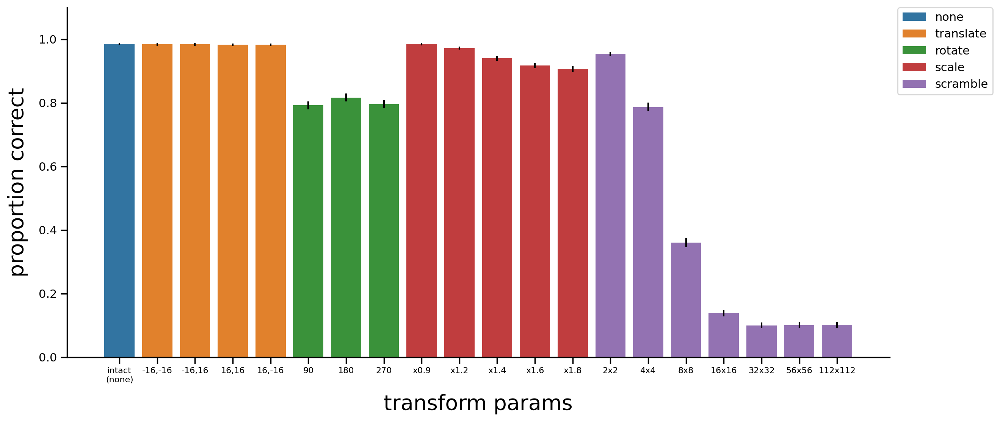

In [82]:
gsi.plot_results(results)

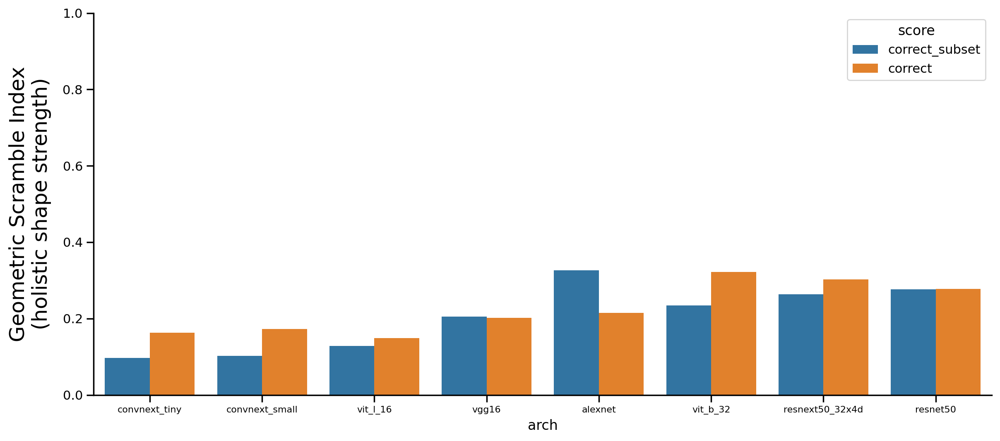

In [34]:
scoreboard, ax = gsi.scoreboard()

In [49]:
scoreboard

,std,arch,mean,task,hash_id,analysis,img_size,crop_size,grayscale,weights_url,...,rotation_seed,train_dataset,score,intact_acc,translation_acc,scale_acc,rotation_acc,geom_tolerance,scramble_auc,geometric_scramble_index
0,"[0.229, 0.224, 0.225]",convnext_tiny,"[0.485, 0.456, 0.406]",category_supervision,983f1562,GeometricScrambleIndex_BlockShuffle,256,224,True,https://download.pytorch.org/models/convnext_t...,...,123456,in1k,correct,0.870573,0.865987,0.612178,0.648917,0.709028,0.545959,0.163068
1,"[0.229, 0.224, 0.225]",convnext_tiny,"[0.485, 0.456, 0.406]",category_supervision,983f1562,GeometricScrambleIndex_BlockShuffle,256,224,True,https://download.pytorch.org/models/convnext_t...,...,123456,in1k,correct_subset,0.998471,0.997197,0.931414,0.969936,0.966183,0.869836,0.096347
2,"[0.229, 0.224, 0.225]",vit_l_16,"[0.485, 0.456, 0.406]",category_supervision,852ce7e3,GeometricScrambleIndex_BlockShuffle,256,224,True,https://download.pytorch.org/models/vit_l_16-8...,...,123456,in1k,correct,0.844586,0.843822,0.685605,0.530021,0.686483,0.537383,0.149100
3,"[0.229, 0.224, 0.225]",vit_l_16,"[0.485, 0.456, 0.406]",category_supervision,852ce7e3,GeometricScrambleIndex_BlockShuffle,256,224,True,https://download.pytorch.org/models/vit_l_16-8...,...,123456,in1k,correct_subset,0.995669,0.994331,0.960713,0.918047,0.957697,0.829267,0.128430
4,"[0.229, 0.224, 0.225]",resnet50,"[0.485, 0.456, 0.406]",category_supervision,0676ba61,GeometricScrambleIndex_BlockShuffle,256,224,True,https://download.pytorch.org/models/resnet50-0...,...,123456,in1k,correct,0.763822,0.758981,0.570803,0.348450,0.559411,0.281351,0.278060
5,"[0.229, 0.224, 0.225]",resnet50,"[0.485, 0.456, 0.406]",category_supervision,0676ba61,GeometricScrambleIndex_BlockShuffle,256,224,True,https://download.pytorch.org/models/resnet50-0...,...,123456,in1k,correct_subset,0.985478,0.983248,0.944153,0.801359,0.909587,0.633053,0.276534
6,"[0.229, 0.224, 0.225]",vgg16,"[0.485, 0.456, 0.406]",category_supervision,397923af,GeometricScrambleIndex_BlockShuffle,256,224,True,https://download.pytorch.org/models/vgg16-3979...,...,123456,in1k,correct,0.678471,0.666115,0.394497,0.282208,0.447607,0.245823,0.201784
7,"[0.229, 0.224, 0.225]",vgg16,"[0.485, 0.456, 0.406]",category_supervision,397923af,GeometricScrambleIndex_BlockShuffle,256,224,True,https://download.pytorch.org/models/vgg16-3979...,...,123456,in1k,correct_subset,0.980127,0.975096,0.828127,0.767983,0.857069,0.651852,0.205217
8,"[0.229, 0.224, 0.225]",alexnet,"[0.485, 0.456, 0.406]",category_supervision,7be5be79,GeometricScrambleIndex_BlockShuffle,256,224,True,https://download.pytorch.org/models/alexnet-ow...,...,123456,in1k,correct,0.452994,0.436943,0.306904,0.150998,0.298282,0.083774,0.214507
9,"[0.229, 0.224, 0.225]",alexnet,"[0.485, 0.456, 0.406]",category_supervision,7be5be79,GeometricScrambleIndex_BlockShuffle,256,224,True,https://download.pytorch.org/models/alexnet-ow...,...,123456,in1k,correct_subset,0.908025,0.899363,0.809834,0.633206,0.780801,0.454279,0.326522


In [10]:
gsi = GeometricScrambleIndex_BlockRotate('imagenette2', entity='alvarezlab', project='geometric-scramble-eval-dev')
gsi

In [11]:
results2, config2 = gsi(model, transform, wandb=False, hash_id=hash_id, meta=meta, recompute=False)
print(results2.keys())

dict_keys(['rawdata', 'summary', 'geometric_scramble_index'])


<Axes: xlabel='transform params', ylabel='proportion correct'>

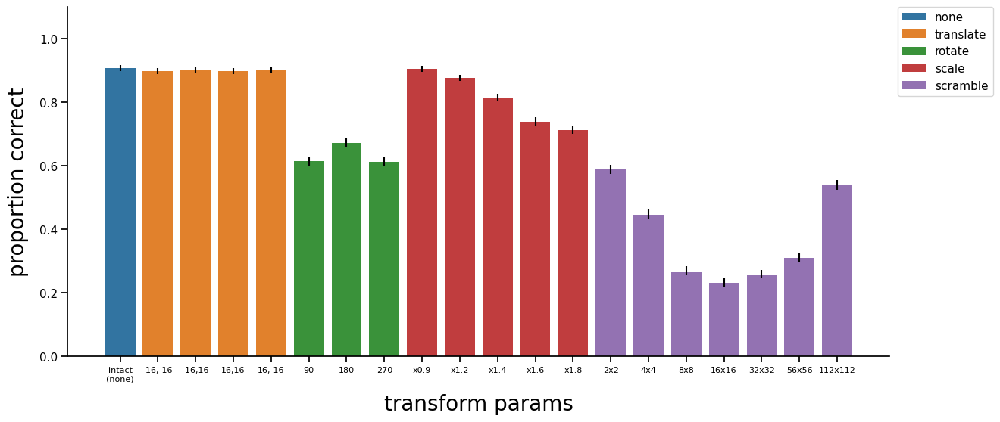

In [12]:
gsi.plot_results(results2)

In [19]:
gsi = GeometricScrambleIndex_BlockShuffleRotate('imagenette2', entity='alvarezlab', project='geometric-scramble-eval-dev')
gsi

In [20]:
results3, config3 = gsi(model, transform, wandb=False, hash_id=hash_id, meta=meta, recompute=False)
print(results3.keys())

dict_keys(['rawdata', 'summary', 'geometric_scramble_index'])


<Axes: xlabel='transform params', ylabel='proportion correct'>

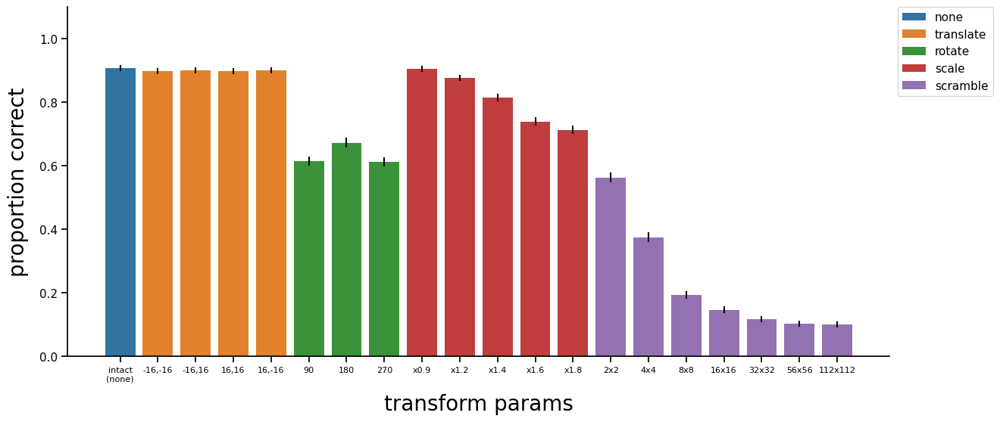

In [21]:
gsi.plot_results(results3)

In [24]:
results['geometric_scramble_index']

,score,intact_acc,translation_acc,scale_acc,rotation_acc,geom_tolerance,scramble_auc,geometric_scramble_index
0,correct,0.452994,0.436943,0.306904,0.150998,0.298282,0.083774,0.214507
1,correct_subset,0.908025,0.899363,0.809834,0.633206,0.780801,0.454279,0.326522


In [25]:
results2['geometric_scramble_index']

,score,intact_acc,translation_acc,scale_acc,rotation_acc,geom_tolerance,scramble_auc,geometric_scramble_index
0,correct,0.452994,0.436943,0.306904,0.150998,0.298282,0.049123,0.249158
1,correct_subset,0.908025,0.899363,0.809834,0.633206,0.780801,0.417507,0.363294


In [22]:
results3['geometric_scramble_index']

,score,intact_acc,translation_acc,scale_acc,rotation_acc,geom_tolerance,scramble_auc,geometric_scramble_index
0,correct,0.452994,0.436943,0.306904,0.150998,0.298282,0.036584,0.261698
1,correct_subset,0.908025,0.899363,0.809834,0.633206,0.780801,0.346198,0.434603


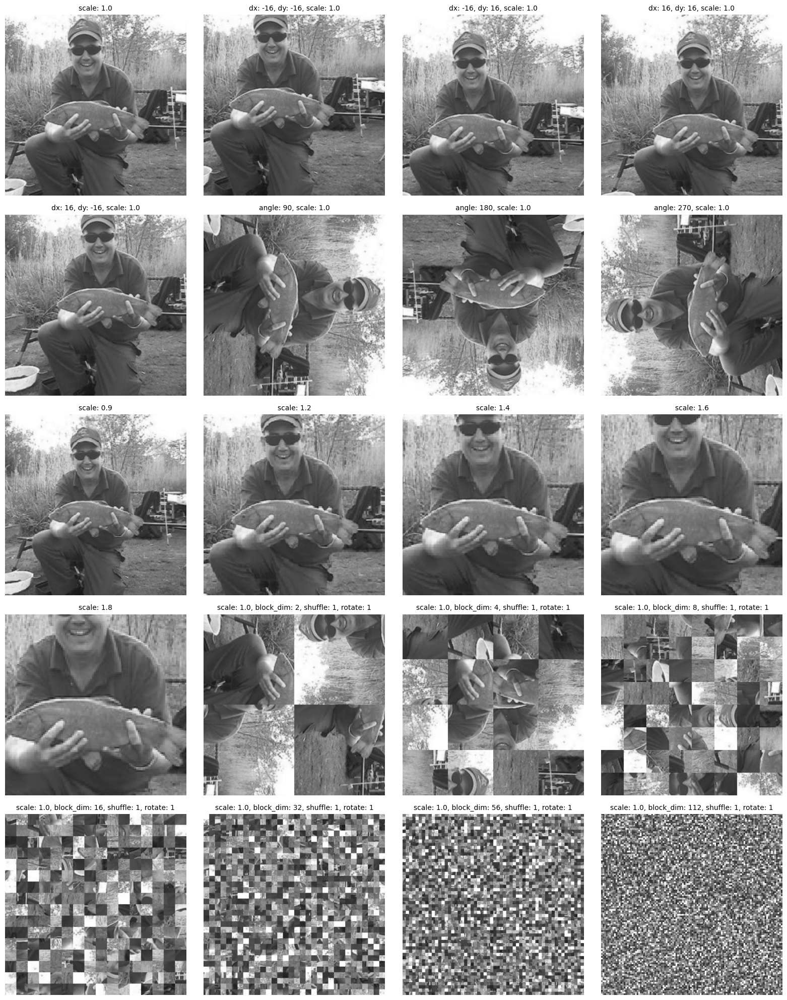

In [23]:
gsi.show_images(index=1)